In [1]:
import os
import numpy as np
import pandas as pd

from time import time

from scipy.stats import ks_2samp

# from imblearn.over_sampling import ADASYN, SMOTE, BorderlineSMOTE, KMeansSMOTE, SMOTEN, SMOTENC, SVMSMOTE
# from imblearn.combine import SMOTEENN, SMOTETomek

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier

from lightgbm import LGBMClassifier

from catboost import CatBoostClassifier

from imblearn.ensemble import BalancedBaggingClassifier, BalancedRandomForestClassifier, EasyEnsembleClassifier


from sklearn.metrics import roc_curve, precision_recall_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix

actual_metrics_data_columns = ['model', 'train_accuracy', 'test_accuracy', 'roc_auc',
                         'precision_0', 'recall_0', 'f1_0',
                         'precision_1', 'recall_1', 'f1_1', 
                         'ks_stat', 'p_value', 
                         'tp', 'tn', 'fp', 'fn']

model_list = [ 'logistic_regression','gaussian_naive_bayes','support_vector_classifier',
              'ada_boost','extra_trees_classifier','gradient_boosting_classifier',
              'hist_gradient_boosting_classifier','random_forest_classifier',
              'balanced_bagging_classifier','balanced_random_forest_classifier',
              'easy_ensemble_classifier','lgbm_classifier','catboost_classifier']

import warnings
warnings.filterwarnings('ignore')



In [2]:
evaluation_files_loc = './final_results/baseline_models_evaluation/'
if not os.path.exists(evaluation_files_loc):
    os.makedirs(evaluation_files_loc)

## Data preperation and evaluation

In [4]:
# Data preparation and Evaluation

def features_target_split(df, target_col='Exited'):
    """
    Split the DataFrame into features and target variables.
    
    Parameters:
        df (DataFrame): The input DataFrame.
        target_col (str): The name of the target column. Default is 'Exited'.
        
    Returns:
        x (DataFrame): The features.
        y (Series): The target variable.
    """
    # Drop the target column from the DataFrame to get the features
    x = df.drop(target_col, axis=1)
    
    # Assign the target column as the y variable
    y = df[target_col]
    
    # Return the features and target variables
    return x,y


def train_test_split(x,y,df,target_col='Exited', test_size=0.1, random_state=42):
    """
    Split the features and target variables into training and testing sets.
    
    Parameters:
        x (DataFrame): The features.
        y (Series): The target variable.
        df (DataFrame): The original DataFrame.
        target_col (str): The name of the target column. Default is 'Exited'.
        test_size (float or int): The proportion or absolute number of samples to include in the testing set. Default is 0.2.
        random_state (int): The seed used by the random number generator. Default is 42.
        
    Returns:
        x_train (DataFrame): The training set features.
        x_test (DataFrame): The testing set features.
        y_train (Series): The training set target variable.
        y_test (Series): The testing set target variable.
    """
    from sklearn.model_selection import train_test_split
    
    # Split the features and target variables into training and testing sets
    # Stratified is being used to maintain the proportion of class [0 and 1] in splits.
    x_train, x_test, y_train, y_test = train_test_split(x, y, 
                                                        test_size=test_size, 
                                                        random_state=random_state, 
                                                        stratify=df[target_col])
    
    return x_train, x_test, y_train, y_test


def prediction(model, x_train, x_test):
    """
    Generate predictions using a trained logistic regression model.
    
    Parameters:
        log_reg_model (LogisticRegression): The trained logistic regression model.
        x_train (array-like or sparse matrix): The training set features.
        x_test (array-like or sparse matrix): The testing set features.
        
    Returns:
        y_pred_train (array-like): Predicted labels for the training set.
        y_pred_test (array-like): Predicted labels for the testing set.
        y_pred_test_proba (array-like): Predicted probabilities for the testing set.
    """
    # Generate predictions for the training set
    y_pred_train = model.predict(x_train)
    
    # Generate predictions for the testing set
    y_pred_test = model.predict(x_test)
    
    # Generate predicted probabilities for the testing set
    y_pred_test_proba = model.predict_proba(x_test)
    
    return y_pred_train, y_pred_test, y_pred_test_proba


class Evaluation():
    def __init__(self,y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba):
        self.y_train = y_train
        self.y_test = y_test
        self.y_pred_train = y_pred_train
        self.y_pred_test = y_pred_test
        self.y_pred_test_proba = y_pred_test_proba
    
    def __ks_stats_value__(self):
        """
        Calculate the Kolmogorov-Smirnov (KS) statistic and p-value.
        
        Returns:
            ks_stat (float): The KS statistic.
            p_value (float): The p-value.
        """
        
        # proba_non_churn contains the predicted probabilities for instances that did not churn
        proba_non_churn = self.y_pred_test_proba[:,1][self.y_test==0]
        
        # proba_churn contains the predicted probabilities for instances that actually churned
        proba_churn = self.y_pred_test_proba[:,1][self.y_test==1]
        
        # Calculating Kolmogorov-Smirnov (KS) statistic and p-value
        ks_stat, p_value = ks_2samp(proba_non_churn, proba_churn)
        return ks_stat, p_value
    
    def __accuracy_value__(self):
        train_accuracy = accuracy_score(self.y_train, self.y_pred_train)
        test_accuracy = accuracy_score(self.y_test, self.y_pred_test)
        return train_accuracy, test_accuracy

    def __prec_rec_f1_value__(self, pos_label):
        """
        Calculate precision, recall, and F1-score for a given label.
        
        Parameters:
            pos_label: The label for which metrics are calculated.
        
        Returns:
            precision (float): Precision score.
            recall (float): Recall score.
            f1 (float): F1-score.
        """
        precision = precision_score(self.y_test, self.y_pred_test,pos_label=pos_label)
        recall = recall_score(self.y_test, self.y_pred_test,pos_label=pos_label)
        f1 = f1_score(self.y_test, self.y_pred_test, pos_label=pos_label)
        return precision, recall, f1

    def __roc_value__(self):
        roc_auc = roc_auc_score(self.y_test, self.y_pred_test)
        return roc_auc

    def __confusion_matrix_value__(self):
        tn, fp, fn, tp = confusion_matrix(self.y_test, self.y_pred_test).ravel()
        return tn, fp, fn, tp
    
    def main(self):
        train_accuracy, test_accuracy = self.__accuracy_value__()
        
        precision_0, recall_0, f1_0 = self.__prec_rec_f1_value__(pos_label=0)
        precision_1, recall_1, f1_1 = self.__prec_rec_f1_value__(pos_label=1)
        
        ks_stat, p_value = self.__ks_stats_value__()
        
        roc_auc = self.__roc_value__()
        
        tn, fp, fn, tp = self.__confusion_matrix_value__()
        
        all_metrics = [train_accuracy, test_accuracy, roc_auc, 
                       precision_0, recall_0, f1_0, 
                       precision_1, recall_1, f1_1, 
                       ks_stat, p_value, 
                       tp, tn, fp, fn]
        
        all_metrics = [round(value, ndigits=6) for value in all_metrics]
        all_metrics_dict = {'train_acc':all_metrics[0], 'test_acc':all_metrics[1], 'roc_auc':all_metrics[2],  
                            'class_0':{'precision':all_metrics[3], 'recall':all_metrics[4], 'f1':all_metrics[5]}, 
                            'class_1':{'precision':all_metrics[6], 'recall':all_metrics[7], 'f1':all_metrics[8]},
                            'ks_stats':all_metrics[9], 'p_value':all_metrics[10],
                            'tp':all_metrics[11],'tn':all_metrics[12],'fp':all_metrics[13],'fn':all_metrics[14]}
        
        return all_metrics, all_metrics_dict

## Models

In [5]:
def logistic_model_train(x_train, y_train, random_state=42, max_iter=1000):
    """
    Train a logistic regression model using the provided training data.
    
    Parameters:
        x_train (DataFrame): The training set features.
        y_train (Series): The training set target variable.
        random_state (int): The seed used by the random number generator. Default is 42.
        max_iter (int): The maximum number of iterations for the solver to converge. Default is 1000.
        
    Returns:
        log_reg_model (LogisticRegression): The trained logistic regression model.
    """
    
    # Create an instance of LogisticRegression model with specified random_state and max_iter
    log_reg_model = LogisticRegression(random_state=random_state, max_iter=max_iter)
    
    # Fit the logistic regression model to the training data
    log_reg_model.fit(x_train, y_train)
    
    return log_reg_model


def gnb_model_train(x_train, y_train):
    
    # instantiate the model
    gnb = GaussianNB()
    gnb.fit(x_train, y_train)
    return gnb

def svc_model_train(x_train, y_train, random_state=42):

    svc = SVC(probability=True,random_state=random_state)
    svc.fit(x_train, y_train)
    return svc

def adaboost_model_train(x_train, y_train, random_state=42):

    adb_model = AdaBoostClassifier(random_state=random_state)
    adb_model.fit(x_train, y_train)
    return adb_model

def etc_model_train(x_train, y_train, random_state=42):
    etc_model = ExtraTreesClassifier(random_state=random_state)
    etc_model.fit(x_train, y_train)
    return etc_model

def gbc_model_train(x_train, y_train, random_state=42):
    gbc_model = GradientBoostingClassifier(random_state=random_state)
    gbc_model.fit(x_train, y_train)
    return gbc_model

def hgbc_model_train(x_train, y_train, random_state=42):
    hgbc_model = HistGradientBoostingClassifier(random_state=random_state)
    hgbc_model.fit(x_train, y_train)
    return hgbc_model

def rfc_model_train(x_train, y_train, random_state=42):
    rfc_model = RandomForestClassifier(random_state=random_state)
    rfc_model.fit(x_train, y_train)
    return rfc_model

def bbc_model_train(x_train, y_train, random_state=42):
    bbc_model = BalancedBaggingClassifier(random_state=random_state)
    bbc_model.fit(x_train, y_train)
    return bbc_model

def brfc_model_train(x_train, y_train, random_state=42):
    brfc_model = BalancedRandomForestClassifier(random_state=random_state)
    brfc_model.fit(x_train, y_train)
    return brfc_model

def eec_model_train(x_train, y_train, random_state=42):
    eec_model = EasyEnsembleClassifier(random_state=random_state)
    eec_model.fit(x_train, y_train)
    return eec_model

def lgbm_model_train(x_train, y_train, random_state=42):
    lgbm_model = LGBMClassifier(random_state=random_state)
    lgbm_model.fit(x_train, y_train)
    return lgbm_model

def catboost_model_train(x_train, y_train, random_state=42):
    catboost_model = CatBoostClassifier(random_state=random_state)
    catboost_model.fit(x_train, y_train, verbose=False)
    return catboost_model

def train_all_models(x_train, y_train, model_name):
    
    if model_name == 'logistic_regression':
        model = logistic_model_train(x_train, y_train)
        
    elif model_name == 'gaussian_naive_bayes':
        model = gnb_model_train(x_train, y_train)
        
    elif model_name == 'support_vector_classifier':
        model = svc_model_train(x_train, y_train)
        
    elif model_name == 'ada_boost':
        model = adaboost_model_train(x_train, y_train)
        
    elif model_name == 'extra_trees_classifier':
        model = etc_model_train(x_train, y_train)

    elif model_name == 'gradient_boosting_classifier':
        model = gbc_model_train(x_train, y_train)
    
    elif model_name == 'hist_gradient_boosting_classifier':
        model = hgbc_model_train(x_train, y_train)
    
    elif model_name == 'random_forest_classifier':
        model = rfc_model_train(x_train, y_train)

    elif model_name == 'balanced_bagging_classifier':
        model = bbc_model_train(x_train, y_train)
        
    elif model_name == 'balanced_random_forest_classifier':
        model = brfc_model_train(x_train, y_train)
        
    elif model_name == 'easy_ensemble_classifier':
        model = eec_model_train(x_train, y_train)

    elif model_name == 'lgbm_classifier':
        model = lgbm_model_train(x_train, y_train)

    elif model_name == 'catboost_classifier':
        model = catboost_model_train(x_train, y_train)

    else:
        print("Check model name")
    
    return model

# Training with numerical data only

## Reading Data

In [12]:
# File location of the dataset
data_loc = "./Churn_Modelling.csv"

# Read the CSV file into a Pandas DataFrame, using the first column as the index
df = pd.read_csv(data_loc, index_col=0)

# df.head()

# Drop all categorical columns
df.drop(['CustomerId', 'Surname','Geography', 'Gender'], axis = 1,inplace=True)
df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,
1,619,42,2,0.00,1,1,1,101348.88,1
2,608,41,1,83807.86,1,0,1,112542.58,0
3,502,42,8,159660.80,3,1,0,113931.57,1
4,699,39,1,0.00,2,0,0,93826.63,0
5,850,43,2,125510.82,1,1,1,79084.10,0


## Train Test Split

In [13]:
# Split the DataFrame into features and target variables.
x,y = features_target_split(df)

# Split the features and target variables into training and testing sets.
x_train, x_test, y_train, y_test = train_test_split(x,y,df)

## Training

In [14]:
actual_metrics_data = []
for model_name in model_list:
    model = train_all_models(x_train, y_train, model_name)
    
    # Generate predictions
    y_pred_train, y_pred_test, y_pred_test_proba = prediction(model, x_train, x_test)

    # Calculate evaluation metrics
    model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)
    
    all_metrics,_ = model_evaluation.main()
    all_metrics.insert(0, model_name)
    
    print("{:<40} :: Train Acc: {:<14} :: Test Acc: {}".format(model_name.upper(), all_metrics[1], all_metrics[2]) )

    actual_metrics_data.append(all_metrics)
#     break
    
metrics_df = pd.DataFrame(actual_metrics_data, columns=actual_metrics_data_columns)
metrics_df.to_csv(os.path.join(evaluation_files_loc, 'baseline_models_eval_num_data.csv'), header=True, index=False)

LOGISTIC_REGRESSION                      :: Train Acc: 0.79625        :: Test Acc: 0.7965
GAUSSIAN_NAIVE_BAYES                     :: Train Acc: 0.784375       :: Test Acc: 0.784
SUPPORT_VECTOR_CLASSIFIER                :: Train Acc: 0.79625        :: Test Acc: 0.7965
ADA_BOOST                                :: Train Acc: 0.848375       :: Test Acc: 0.844
EXTRA_TREES_CLASSIFIER                   :: Train Acc: 1.0            :: Test Acc: 0.847
GRADIENT_BOOSTING_CLASSIFIER             :: Train Acc: 0.86375        :: Test Acc: 0.8605
HIST_GRADIENT_BOOSTING_CLASSIFIER        :: Train Acc: 0.900875       :: Test Acc: 0.8505
RANDOM_FOREST_CLASSIFIER                 :: Train Acc: 1.0            :: Test Acc: 0.8545
BALANCED_BAGGING_CLASSIFIER              :: Train Acc: 0.93125        :: Test Acc: 0.795
BALANCED_RANDOM_FOREST_CLASSIFIER        :: Train Acc: 0.89725        :: Test Acc: 0.7675
EASY_ENSEMBLE_CLASSIFIER                 :: Train Acc: 0.772          :: Test Acc: 0.77
LGBM_CLASSIFIER 

# Training with numerical and categorical data

## Reading data

In [328]:
# importing libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder

# File location of the dataset
data_loc = "./Churn_Modelling.csv"

# Read the CSV file into a Pandas DataFrame, using the first column as the index
df = pd.read_csv(data_loc, index_col=0)

df['new_column'] = ((df.Balance + df.EstimatedSalary)/df.CreditScore) * (1/df.NumOfProducts)

# Converting type of columns to category
df['Geography'] = df['Geography'].astype('category')
df['Gender'] = df['Gender'].astype('category')
df['NumOfProducts'] = df['Geography'].astype('category')
df['Tenure'] = df['Tenure'].astype('category')
# df['Surname'] = df['Surname'].astype('category')

# Assigning numerical values and storing it in another columns
df['Geography_new'] = df['Geography'].cat.codes
df['Gender_new'] = df['Gender'].cat.codes
df['NumOfProducts_new'] = df['NumOfProducts'].cat.codes
df['Tenure_new'] = df['Tenure'].cat.codes
# df['Surname_new'] = df['Surname'].cat.codes



# Create an instance of One-hot-encoder
enc = OneHotEncoder()

# Passing encoded columns

enc_data = pd.DataFrame(enc.fit_transform(df[['Geography_new', 'Gender_new', 'NumOfProducts_new', 'Tenure_new']]).toarray())
enc_data.index = np.arange(1, len(enc_data) + 1)

# Merge with main
New_df = df.join(enc_data)
New_df.drop(['CustomerId','Geography','Gender', 'Geography_new', 'Gender_new', 'Surname' ,'NumOfProducts_new', 'Tenure_new', 'NumOfProducts','Tenure'], axis=1, inplace=True)
df = New_df
df


,CreditScore,Age,Balance,HasCrCard,IsActiveMember,EstimatedSalary,Exited,new_column,0,1,...,9,10,11,12,13,14,15,16,17,18
RowNumber,,,,,,,,,,,,,,,,,,,,,
1,619,42,0.00,1,1,101348.88,1,163.730016,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,608,41,83807.86,0,1,112542.58,0,322.944803,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,502,42,159660.80,1,0,113931.57,1,181.668240,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,699,39,0.00,0,0,93826.63,0,67.114900,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,850,43,125510.82,1,1,79084.10,0,240.699906,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,771,39,0.00,1,0,96270.64,0,62.432322,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
9997,516,35,57369.61,1,1,101699.77,0,308.273992,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9998,709,36,0.00,0,1,42085.58,1,59.359069,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [6]:
# File location of the dataset
data_loc = "./Churn_Modelling.csv"

# Read the CSV file into a Pandas DataFrame, using the first column as the index
df = pd.read_csv(data_loc, index_col=0)

# df['new_column_1'] = df['Geography'].map({'Germany': 1, 'Spain':0, 'France':0})

# df.head()

# Converting type of columns to category
df['Geography'] = df['Geography'].astype('category')
df['Gender'] = df['Gender'].astype('category')
df['Surname'] = df['Surname'].astype('category')

# Assigning numerical values and storing it in another columns
df['Geography_new'] = df['Geography'].cat.codes
df['Gender_new'] = df['Gender'].cat.codes
df['Surname_new'] = df['Surname'].cat.codes

df['Geography'] = df['Geography_new']
df['Gender'] = df['Gender_new']
df['Surname'] = df['Surname_new']

df.drop(['CustomerId','Surname_new','Geography_new', 'Gender_new'], axis = 1,inplace=True)
# df.drop(['CustomerId', 'Surname','Geography', 'Gender'], axis = 1,inplace=True)
df.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,
1,1115,619,0,0,42,2,0.00,1,1,1,101348.88,1
2,1177,608,2,0,41,1,83807.86,1,0,1,112542.58,0
3,2040,502,0,0,42,8,159660.80,3,1,0,113931.57,1
4,289,699,0,0,39,1,0.00,2,0,0,93826.63,0
5,1822,850,2,0,43,2,125510.82,1,1,1,79084.10,0


In [349]:
df.drop(df.loc[(df['Balance']==0) & (df['Exited'] == 0)].index, inplace=True)
df

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,
1,1115,619,0,0,42,2,0.00,1,1,1,101348.88,1
2,1177,608,2,0,41,1,83807.86,1,0,1,112542.58,0
3,2040,502,0,0,42,8,159660.80,3,1,0,113931.57,1
5,1822,850,2,0,43,2,125510.82,1,1,1,79084.10,0
6,537,645,2,1,44,8,113755.78,2,1,0,149756.71,1
...,...,...,...,...,...,...,...,...,...,...,...,...
9994,2226,644,0,1,28,7,155060.41,1,1,0,29179.52,0
9997,1336,516,0,1,35,10,57369.61,1,1,1,101699.77,0
9998,1570,709,0,0,36,7,0.00,1,0,1,42085.58,1


In [425]:
df.describe()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,1507.774200,650.528800,0.746300,0.545700,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,846.204311,96.653299,0.827529,0.497932,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,0.000000,350.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,773.750000,584.000000,0.000000,0.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,1542.000000,652.000000,0.000000,1.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,2238.250000,718.000000,1.000000,1.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,2931.000000,850.000000,2.000000,1.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [463]:
# df_1 = df[df.Exited == 0]
# df_1

In [464]:
# df_1.columns
# pd.DataFrame(df_1.values[0:10], columns=df_1.columns)

In [88]:
df.groupby('Age').Exited.sum().index

Int64Index([18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
            35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
            52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
            69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
            88, 92],
           dtype='int64', name='Age')

In [87]:
df.groupby('Age').Exited.sum().values

array([ 2,  1,  2,  3, 12,  6, 14,  6, 14, 13, 23, 28, 24, 33, 32, 44, 33,
       57, 53, 62, 63, 72, 89, 69, 77, 88, 73, 87, 91, 77, 80, 75, 71, 66,
       64, 40, 51, 48, 50, 38, 29, 30, 32, 21, 21, 18, 12,  8,  7,  5,  6,
        2,  4,  7,  1,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  0,
        0,  0])

In [93]:
df[(df.Age == 46) & (df.HasCrCard == 1)].Exited.value_counts()

0    107
1     72
Name: Exited, dtype: int64

In [445]:
# df = df[df.Exited == 1]

In [465]:
# df = pd.concat([df, pd.DataFrame(df_1.values[0:10], columns=df_1.columns)])

In [19]:
# # Define the age groups and their corresponding labels
# age_groups = [(15, 30), (31, 44), (45, 100)]
# age_group_labels = ['young', 'middle-aged', 'senior']

# # Assuming your dataset is stored in a pandas DataFrame called 'df'
# df['AgeGroup'] = pd.cut(df['Age'], bins=[group[0] - 1 for group in age_groups] + [age_groups[-1][1]], labels=age_group_labels)
# df.head()
# # df.drop(['Age'],axis=1, inplace=True)

In [6]:
# # Define the credit score categories and corresponding labels
# # score_bins = [350, 450, 550, 650, 750, 850]
# # score_labels = ['Very Poor', 'Fair', 'Good', 'Very Good', 'Exceptional']

# # Define the credit score categories and corresponding labels
# credit_score_bins = [350, 450, 550, 650, 750, 850]  # Specify the bin boundaries
# credit_score_labels = ['Very Poor', 'Fair', 'Good', 'Very Good', 'Exceptional']

# # Create a new column 'CreditScoreCategory' with the credit score categories
# df['CreditScoreCategory'] = pd.cut(df['CreditScore'], bins=credit_score_bins, 
#                                    labels=credit_score_labels, 
#                                    include_lowest=True)

# # Handling empty values
# # data['CreditScoreCategory'].fillna('Unknown', inplace=True)

# # Create the 'CreditScoreCategory' feature based on the defined bins and labels
# # df['CreditScoreCategory'] = pd.cut(df['CreditScore'], bins=score_bins, labels=score_labels, right=False)
# # Handling empty values
# df['CreditScoreCategory'].fillna('Unknown', inplace=True)
# # df.drop(['CreditScore'],axis=1, inplace=True)

In [7]:
# Assuming your dataset is stored in a variable called 'df'
# df['Balance_to_Salary_Ratio'] = df['Balance'] / df['EstimatedSalary']

In [295]:
[i for i in zip(catboost_model.feature_names_, catboost_model.feature_importances_)]

[('Surname', 7.639775550157294),
 ('CreditScore', 5.8138812314290576),
 ('Geography', 7.8722579743244125),
 ('Gender', 3.2453988588357183),
 ('Age', 15.634476413215255),
 ('Tenure', 1.403934638253023),
 ('Balance', 5.037330240339227),
 ('NumOfProducts', 13.157079564829486),
 ('HasCrCard', 0.948312091952146),
 ('IsActiveMember', 6.286252987995233),
 ('EstimatedSalary', 6.244617379552741),
 ('new_column', 5.513420708503286),
 ('new_column_4', 5.2660956880100676),
 ('new_column_5', 4.788490618665318),
 ('new_column_6', 4.915670181994357),
 ('new_column_7', 6.233005871943302)]

In [293]:
catboost_model.feature_names_

['Surname',
 'CreditScore',
 'Geography',
 'Gender',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'new_column',
 'new_column_4',
 'new_column_5',
 'new_column_6',
 'new_column_7']

In [294]:
catboost_model.feature_importances_

array([ 7.63977555,  5.81388123,  7.87225797,  3.24539886, 15.63447641,
        1.40393464,  5.03733024, 13.15707956,  0.94831209,  6.28625299,
        6.24461738,  5.51342071,  5.26609569,  4.78849062,  4.91567018,
        6.23300587])

In [307]:
# Define the feature weights based on their significance in predicting churn
feature_weights = {
'Surname': 7.639775550157294,
 'CreditScore': 5.8138812314290576,
 'Geography': 7.8722579743244125,
 'Gender': 3.2453988588357183,
 'Age': 15.634476413215255,
 'Tenure': 1.403934638253023,
 'Balance': 5.037330240339227,
 'NumOfProducts': 13.157079564829486,
 'HasCrCard': 0.948312091952146,
 'IsActiveMember': 6.286252987995233,
 'EstimatedSalary': 6.244617379552741,
 'new_column': 5.513420708503286,
 'new_column_4': 5.2660956880100676,
 'new_column_5': 4.788490618665318,
 'new_column_6': 4.915670181994357,
 'new_column_7': 6.23300587194330
}

# Calculate the churn proximity score
df['churn_proximity_score'] = sum(
    df[feature] * weight for feature, weight in feature_weights.items()
)

# Normalize the churn proximity scores to a standardized range (0 to 1)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df['churn_proximity_score'] = scaler.fit_transform(df['churn_proximity_score'].values.reshape(-1, 1))

# Print the updated DataFrame with the churn proximity scores
# print(df[['S', 'churn_proximity_score']])

In [303]:
df

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,new_column,new_column_4,new_column_5,new_column_6,new_column_7,churn_proximity_score
RowNumber,,,,,,,,,,,,,,,,,,
1,1115,619,0,0,42,2,0.00,1,1,1,101348.88,1,163.730016,0.00,25998,0.047619,1.000000,0.003394
2,1177,608,2,0,41,1,83807.86,1,0,1,112542.58,0,322.944803,3436122.26,24928,0.024390,0.000012,0.094752
3,2040,502,0,0,42,8,159660.80,3,1,0,113931.57,1,181.668240,20117260.80,21084,0.190476,0.000019,0.528466
4,289,699,0,0,39,1,0.00,2,0,0,93826.63,0,67.114900,0.00,27261,0.025641,2.000000,0.003161
5,1822,850,2,0,43,2,125510.82,1,1,1,79084.10,0,240.699906,5396965.26,36550,0.046512,0.000008,0.145824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,1999,771,0,1,39,5,0.00,2,1,0,96270.64,0,62.432322,0.00,30069,0.128205,2.000000,0.003368
9997,1336,516,0,1,35,10,57369.61,1,1,1,101699.77,0,308.273992,2007936.35,18060,0.285714,0.000017,0.056630
9998,1570,709,0,0,36,7,0.00,1,0,1,42085.58,1,59.359069,0.00,25524,0.194444,1.000000,0.001580


In [7]:
df['new_column'] = ((df.Balance + df.EstimatedSalary)/df.CreditScore) * (1/df.NumOfProducts)
df['new_column'] = np.where(df.NumOfProducts.isin([3,4]), df['new_column']**2, df['new_column'])

# col_1 = 'Age'
# col_2 = 'Age'
# col_3 = 'NumOfProducts'
# col_4 = 'NumOfProducts'
# col_5 = 'NumOfProducts'

# # df = pd.read_csv(dataset_loc, index_col=0)
# df['new_column_1'] = ((df[col_1] + df[col_2])/df[col_3]) * (1/df[col_4])
# df['new_column_1'] = np.where(df[col_5].isin([3,4]), df['new_column_1']**2, df['new_column_1'])

# df['new_column_1'] = df.Balance/df.CreditScore

# df['new_column_3'] = (df.Balance * df.NumOfProducts)
# df['new_column_4'] = (df.Balance * df.NumOfProducts)*df.Age
# df['new_column_5'] = df.CreditScore * df.Age
# df['new_column_6'] = df.Tenure/df.Age
# df['new_column_7'] = df.NumOfProducts/(df.Balance + 1)

# df.drop(['HasCrCard'], axis/=1, inplace=True)
# df['new_column_8'] = df.Age/(df.Balance+1)


# df['new_column_8'] = df.Balance - df.Balance.median()
# df['new_column_9'] = (df.Balance + 1)/df.NumOfProducts
# df['new_column'] = np.where(df.Exited == 1, df['new_column']**2, df['new_column'])
# df['new_column'] = np.where(df.NumOfProducts == 4, df['new_column']**2, df['new_column'])
# df['new_column'] = np.where(df[df.EstimatedSalary>100000][df.Balance>100000][df.NumOfProducts != 1], df['new_column']**2, df['new_column'])
df.corr()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,new_column
Surname,1.000000,0.007489,-0.022878,-0.002049,0.005550,-0.017412,0.002657,-0.016460,-0.008993,0.001483,0.011850,-0.010822,-0.009605
CreditScore,0.007489,1.000000,0.007888,-0.002857,-0.003965,0.000842,0.006268,0.012238,-0.005458,0.025651,-0.001384,-0.027094,-0.066908
Geography,-0.022878,0.007888,1.000000,0.004719,0.022812,0.003739,0.069408,0.003972,-0.008523,0.006724,-0.001369,0.035943,0.021693
Gender,-0.002049,-0.002857,0.004719,1.000000,-0.027544,0.014733,0.012087,-0.021859,0.005766,0.022544,-0.008112,-0.106512,-0.036874
Age,0.005550,-0.003965,0.022812,-0.027544,1.000000,-0.009997,0.028308,-0.030680,-0.011721,0.085472,-0.007201,0.285323,0.060257
Tenure,-0.017412,0.000842,0.003739,0.014733,-0.009997,1.000000,-0.012254,0.013444,0.022583,-0.028362,0.007784,-0.014001,0.010149
Balance,0.002657,0.006268,0.069408,0.012087,0.028308,-0.012254,1.000000,-0.304180,-0.014858,-0.010084,0.012797,0.118533,0.112250
NumOfProducts,-0.016460,0.012238,0.003972,-0.021859,-0.030680,0.013444,-0.304180,1.000000,0.003183,0.009612,0.014204,-0.047820,0.321756
HasCrCard,-0.008993,-0.005458,-0.008523,0.005766,-0.011721,0.022583,-0.014858,0.003183,1.000000,-0.011866,-0.009933,-0.007138,0.006094
IsActiveMember,0.001483,0.025651,0.006724,0.022544,0.085472,-0.028362,-0.010084,0.009612,-0.011866,1.000000,-0.011421,-0.156128,-0.031938


In [188]:
# # Assuming your dataset is stored in a DataFrame called "df"
# df['new_column_1'] = df.apply(lambda row: 1 if row['IsActiveMember'] == 0 and row['HasCrCard'] == 1 and row['NumOfProducts'] in [3, 4] else 0, axis=1)

In [129]:
# df['new_column'] = np.where(df.new_column_1 == 1, df['new_column']**2, df['new_column'])
# df

In [130]:
# df.drop(['new_column_1'], axis=1 , inplace=True)
# df

In [131]:
# df[(df['HasCrCard'] == 1) & (df.NumOfProducts.isin([3,4]))]

In [132]:
# df[(df['IsActiveMember'] == 0) & (df['HasCrCard'] == 1) & (df.NumOfProducts.isin([3,4]))].Exited.value_counts()

In [133]:
# qwe = df[(df['IsActiveMember'] == 0) & (df['HasCrCard'] == 1) & (df['Balance'] ==0)]
# qwe.Exited.value_counts()

In [134]:
# df['new_column'] = np.where(df.IsActiveMember == 1 , df['new_column']**2, df['new_column'])

In [135]:
# df[df.IsActiveMember==1 ][df.HasCrCard == 1]

In [ ]:
df

In [271]:
# df.drop(['EstimatedSalary', 'Tenure'], axis =1,inplace=True)
# df

In [62]:
# df['new_column'] = (((df.Balance + df.EstimatedSalary)/(df.Age))* (df.CreditScore/df.Tenure)) * (1/df.NumOfProducts)

# df['new_column'] = (df.Balance + df.EstimatedSalary)*df.Tenure 

# df['new_column_1'] = ((df.Balance + df.EstimatedSalary)/df.CreditScore) * (1/df.NumOfProducts)


# df['new_column'] = np.where(df['Exited'] == 1, df['new_column']**2, df['new_column'])

# import pandas as pd

# df['Exited'] = df['Exited'].apply(lambda x: x**2 if (((df['Balance'] + df['EstimatedSalary']) / df['CreditScore']) * (1 / df['NumOfProducts'])) else x)


In [325]:
# df.drop(['EstimatedSalary'], axis=1, inplace=True)

In [467]:
# df = df.astype({'Surname':int,'Geography':int, 'Gender':int, 'NumOfProducts':int, 'HasCrCard':int, 'IsActiveMember':int, 'Exited':int})

In [468]:
# df

In [495]:
# x

In [8]:
# Split the DataFrame into features and target variables.
x,y = features_target_split(df)

# Split the features and target variables into training and testing sets.
x_train, x_test, y_train, y_test = train_test_split(x,y,df)

x_train.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,new_column
RowNumber,,,,,,,,,,,,
674,2795,640,2,0,32,6,118879.35,2,1,1,19131.71,107.821141
7710,2022,598,2,0,64,1,62979.93,1,1,1,152273.57,359.955686
6101,1183,796,0,1,30,2,137262.71,2,1,0,62905.29,125.733668
8470,1728,720,0,1,71,5,183135.39,2,1,1,197688.50,264.461035
8564,1526,578,0,1,45,1,148600.91,1,1,0,143397.14,505.186938


In [381]:
from sklearn.ensemble import IsolationForest

In [392]:
isolation_model = IsolationForest(random_state=42,)
isolation_model.fit(x_train, y_train,)

y_pred_train = isolation_model.predict(x_train)
y_pred_test = isolation_model.predict(x_test)

print(classification_report(y_test,y_pred_test))
# Generate predictions
# catboost_model.set_probability_threshold(0.289)
# accuracy_score(y_test, y_pred_test)
#     train_accuracy = accuracy_score(self.y_train, self.y_pred_train)
#     test_accuracy = accuracy_score(self.y_test, self.y_pred_test)
#     return train_accuracy, test_accuracy

# def __prec_rec_f1_value__(self, pos_label):
#     """
#     Calculate precision, recall, and F1-score for a given label.

#     Parameters:
#         pos_label: The label for which metrics are calculated.

#     Returns:
#         precision (float): Precision score.
#         recall (float): Recall score.
#         f1 (float): F1-score.
#     """
#     precision = precision_score(self.y_test, self.y_pred_test,pos_label=pos_label)
#     recall = recall_score(self.y_test, self.y_pred_test,pos_label=pos_label)
#     f1 = f1_score(self.y_test, self.y_pred_test, pos_label=pos_label)
#     return precision, recall, f1

# def __roc_value__(self):
#     roc_auc = roc_auc_score(self.y_test, self.y_pred_test)
#     return roc_auc

# def __confusion_matrix_value__(self):
#     tn, fp, fn, tp = confusion_matrix(self.y_test, self.y_pred_test).ravel()
#     return tn, fp, fn, tp


              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1593
           1       0.19      0.32      0.24       407

    accuracy                           0.06      2000
   macro avg       0.06      0.11      0.08      2000
weighted avg       0.04      0.06      0.05      2000



In [393]:
confusion_matrix(y_test, y_pred_test)

array([[   0,    0,    0],
       [1036,    0,  557],
       [ 278,    0,  129]])

In [398]:
x_test['Exited'] = y_test
x_test['Exited_pred'] = y_pred_test

In [401]:
x_test[(x_test.Exited_pred == -1) & (df.Exited == 1)]

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,new_column,Exited,Exited_pred
RowNumber,,,,,,,,,,,,,,
4800,1334,551,0,1,52,1,0.00,1,0,0,63584.55,115.398457,1,-1
4995,451,796,1,0,52,9,167194.36,1,1,1,62808.93,288.948857,1,-1
5387,968,642,0,1,48,9,118317.27,4,0,0,78702.98,76.721281,1,-1
1021,2066,625,0,1,49,6,173434.90,1,1,0,165580.93,542.425328,1,-1
9801,1549,762,2,0,35,3,119349.69,3,1,1,47114.18,72.818841,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5265,1288,547,2,0,44,5,0.00,3,0,0,5459.07,3.326673,1,-1
1382,187,846,0,0,41,5,0.00,3,1,0,3440.47,1.355583,1,-1
5751,2853,747,1,1,37,9,135776.36,3,1,0,85470.45,98.726823,1,-1


In [627]:
    objective: Logloss
    n_estimators: 377
    colsample_bylevel: 0.09675081225853586
    depth: 6
    boosting_type: Plain
    bootstrap_type: MVS
        
   objective: Logloss
    n_estimators: 645
    colsample_bylevel: 0.09079297892250282
    depth: 13
    boosting_type: Ordered
    bootstrap_type: MVS

NameError: name 'Logloss' is not defined

In [7]:
# Split the DataFrame into features and target variables.
x,y = features_target_split(df)

# Split the features and target variables into training and testing sets.
x_train, x_test, y_train, y_test = train_test_split(x,y,df)

x_train.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,new_column,new_column_1
RowNumber,,,,,,,,,,,,,
2152,2760,753,0,1,57,7,0.00,1,1,0,159475.08,211.786295,114.0
8393,210,739,1,1,32,3,102128.27,1,1,0,63981.37,224.776238,64.0
5007,504,755,1,0,37,0,113865.23,2,1,1,117396.25,153.153298,18.5
4118,2097,561,0,1,37,5,0.00,2,1,0,83093.25,74.058155,18.5
7183,2267,692,1,1,49,6,110540.43,2,0,1,107472.99,157.524147,24.5


In [9]:
catboost_model = CatBoostClassifier(random_state=42,cat_features=[0,2,3,7,8,9])
catboost_model.fit(x_train, y_train, verbose=False)

# catboost_model.set_probability_threshold(0.5365533354184273)

In [18]:
# Generate predictions
catboost_model.set_probability_threshold(0.344)
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.882889,
 'test_acc': 0.847,
 'roc_auc': 0.763536,
 'class_0': {'precision': 0.903388, 'recall': 0.904523, 'f1': 0.903955},
 'class_1': {'precision': 0.625616, 'recall': 0.622549, 'f1': 0.624079},
 'ks_stats': 0.600897,
 'p_value': 0.0,
 'tp': 127,
 'tn': 720,
 'fp': 76,
 'fn': 77}

In [9]:
# Generate predictions
catboost_model.set_probability_threshold(0.335)
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.882375,
 'test_acc': 0.8555,
 'roc_auc': 0.772096,
 'class_0': {'precision': 0.906484, 'recall': 0.912743, 'f1': 0.909603},
 'class_1': {'precision': 0.64899, 'recall': 0.63145, 'f1': 0.6401},
 'ks_stats': 0.58144,
 'p_value': 0.0,
 'tp': 257,
 'tn': 1454,
 'fp': 139,
 'fn': 150}

In [33]:
!conda install -c conda-forge shap -y

Retrieving notices: ...working... done
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.1.0
  latest version: 23.3.1

Please update conda by running

    $ conda update -n base -c defaults conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.3.1



## Package Plan ##

  environment location: /home/growlt200/anaconda3/envs/aml

  added / updated specs:
    - shap


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    cloudpickle-2.2.1          |     pyhd8ed1ab_0          27 KB  conda-forge
    llvmlite-0.40.0            |   py38he621ea3_0         2.8 MB
    numba-0.57.0               |   py38h1128e8f_0         4.2 MB
    shap-0.41.0                |   py38h1128e8f_1         560 KB
    slicer-0.0.7               |     pyhd8ed1ab_0          16 KB  conda-forge
    tbb-2021.8.0               |  

In [34]:
import shap
explainer = shap.Explainer(catboost_model)
shap_values = explainer.shap_values(x_train)


In [36]:
# Select a data instance to visualize (e.g., the first instance)
instance_index = 0
instance_shap_values = shap_values[instance_index]

# Visualize the feature importance for the selected instance
shap.force_plot(explainer.expected_value, instance_shap_values, x_train.iloc[instance_index])

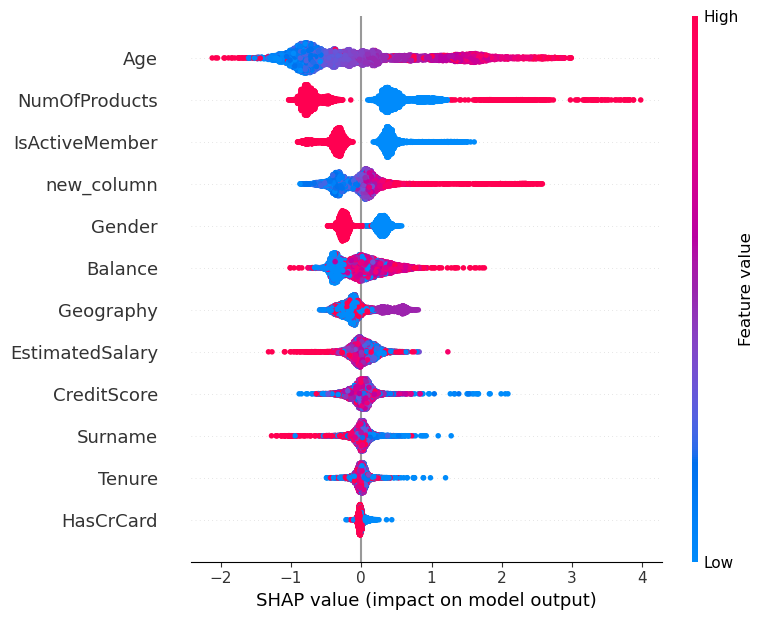

In [35]:
shap.summary_plot(shap_values, x_train)


In [409]:
# Generate predictions
# catboost_model.set_probability_threshold(0.289)
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

# 

{'train_acc': 0.88475,
 'test_acc': 0.8695,
 'roc_auc': 0.73058,
 'class_0': {'precision': 0.882319, 'recall': 0.964846, 'f1': 0.921739},
 'class_1': {'precision': 0.782946, 'recall': 0.496314, 'f1': 0.607519},
 'ks_stats': 0.586118,
 'p_value': 0.0,
 'tp': 202,
 'tn': 1537,
 'fp': 56,
 'fn': 205}

In [323]:
x_test['Exited'] = y_test
x_test['Exited_pred'] = y_pred_test

In [327]:
x_test[(x_test.Exited == 1) & (x_test.Exited_pred == 0) & (x_test.Balance == 0)]

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,new_column,new_column_4,new_column_5,new_column_6,new_column_7,churn_proximity_score,Exited,Exited_pred
RowNumber,,,,,,,,,,,,,,,,,,,
6115,2674,627,0,0,44,5,0.0,2,1,0,82969.61,66.163963,0.0,27588,0.113636,2.0,0.002923,1,0
105,763,670,2,0,65,1,0.0,1,1,1,177655.68,265.157731,0.0,43550,0.015385,1.0,0.006142,1,0
8077,2320,732,0,0,36,9,0.0,1,0,0,3749.00,5.121585,0.0,26352,0.250000,1.0,0.000449,1,0
3275,2173,629,0,0,31,6,0.0,1,1,1,16447.60,26.148808,0.0,19499,0.193548,1.0,0.000670,1,0
5093,2803,688,0,0,39,0,0.0,2,1,0,53222.15,38.678888,0.0,26832,0.000000,2.0,0.001998,1,0
9726,846,625,0,0,36,3,0.0,2,1,0,41295.10,33.036080,0.0,22500,0.083333,2.0,0.001454,1,0
4862,1891,663,2,0,22,9,0.0,1,1,0,29135.89,43.945535,0.0,14586,0.409091,1.0,0.000934,1,0
6540,1334,697,0,0,45,1,0.0,2,1,0,46807.62,33.577920,0.0,31365,0.022222,2.0,0.001853,1,0
307,1167,731,0,1,43,2,0.0,1,1,1,170034.95,232.605951,0.0,31433,0.046512,1.0,0.005637,1,0


In [283]:
[i for i in zip(catboost_model.feature_importances_, catboost_model.feature_names_)]

[(7.43223940975879, 'Surname'),
 (6.112637918159459, 'CreditScore'),
 (7.833355922823273, 'Geography'),
 (3.252633613642168, 'Gender'),
 (15.013365723400803, 'Age'),
 (1.8013409751938345, 'Tenure'),
 (5.507848116873286, 'Balance'),
 (14.298571175572445, 'NumOfProducts'),
 (6.393507413961879, 'IsActiveMember'),
 (6.510714461076243, 'EstimatedSalary'),
 (5.450099967517233, 'new_column'),
 (4.943264172166463, 'new_column_4'),
 (4.739858468640881, 'new_column_5'),
 (5.0321104745737895, 'new_column_6'),
 (5.678452186639705, 'new_column_7')]

In [ ]:
# df['new_column_4'] = (df.Balance * df.NumOfProducts)*df.Age
# df['new_column_5'] = df.CreditScore * df.Age
# df['new_column_6'] = df.Tenure/df.Age
# df['new_column_7'] = df.NumOfProducts/(df.Balance + 1)

# # Generate predictions
# catboost_model.set_probability_threshold(0.32)
# y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# # Calculate evaluation metrics
# model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

# all_metrics,uhuh = model_evaluation.main()
# uhuh

# {'train_acc': 0.8835,
#  'test_acc': 0.856,
#  'roc_auc': 0.777898,
#  'class_0': {'precision': 0.909605, 'recall': 0.909605, 'f1': 0.909605},
#  'class_1': {'precision': 0.646192, 'recall': 0.646192, 'f1': 0.646192},
#  'ks_stats': 0.59035,
#  'p_value': 0.0,
#  'tp': 263,
#  'tn': 1449,
#  'fp': 144,
#  'fn': 144}

In [625]:
import optuna
metrics_data = []
trial_info= {}

def objective(trial):
    # Split the DataFrame into features and target variables.
    x,y = features_target_split(df)

    # Split the features and target variables into training and testing sets.
    x_train, x_test, y_train, y_test = train_test_split(x,y,df)

    param = {
        "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        "n_estimators":trial.suggest_int('n_estimators', 25,1000),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 16),
#         "max_depth": trial.suggest_int("depth", 1, 30),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical(
            "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
        ),
        "used_ram_limit": "3gb",
    }

    if param["bootstrap_type"] == "Bayesian":
        param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif param["bootstrap_type"] == "Bernoulli":
        param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    gbm = CatBoostClassifier(**param,cat_features=[0,2,3,7,8,9], random_state=42)

    gbm.fit(x_train, y_train, eval_set=[(x_test, y_test)], verbose=0, early_stopping_rounds=100)
    
    # Generate predictions
    y_pred_train, y_pred_test, y_pred_test_proba = prediction(gbm, x_train, x_test)

    # Calculate evaluation metrics
    model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

    all_metrics,_ = model_evaluation.main()
    
    all_metrics.insert(0,trial.number)
    
    trial_info[trial.number] = trial.params
    
    metrics_data.append(all_metrics)

    preds = gbm.predict(x_test)
    pred_labels = np.rint(preds)
    accuracy = accuracy_score(y_test, pred_labels)
    return accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=5000, timeout=99999)



[I 2023-05-22 18:56:47,024] A new study created in memory with name: no-name-8843e62c-f629-435a-9d0c-b2cf26b7a514
CatBoost is using more CPU RAM (3.77GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.77GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
R

CatBoost is using more CPU RAM (3.77GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
[I 2023-05-22 18:56:57,266] Trial 8 finished with value: 0.7965 and parameters: {'objective': 'Logloss', 'n_estimators': 204, 'colsample_bylevel': 0.011351342064178791, 'depth': 4, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 5 with value: 0.869.
CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResou

CatBoost is using more CPU RAM (3.79GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Res

CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Res

CatBoost is using more CPU RAM (3.8GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Res

CatBoost is using more CPU RAM (3.09GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.09GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.09GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.1GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.1GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.11GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.11GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.12GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.12GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.16GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.16GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.17GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.17GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.22GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.22GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.22GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.22GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.23GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.23GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.26GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.26GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.27GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.27GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.29GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.29GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.3GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.3GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.61GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.12GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.12GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.13GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.13GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.13GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.13GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.14GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.15GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.16GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.16GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.16GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.16GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.17GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.17GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.17GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.17GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.18GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.19GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.2GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.21GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.22GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.22GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.23GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.23GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.23GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.23GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.24GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.25GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.26GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.27GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.27GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.28GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.29GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.3GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.3GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.31GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.32GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.33GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.34GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.35GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.36GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.37GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.38GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.39GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Res

CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.4GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.41GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.42GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.43GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.44GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.45GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
[I 2023-05-22 19:29:20,581] Trial 635 finished with value: 0.8475 and parameters: {'obj

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Res

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.54GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.55GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.56GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.57GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
[I 2023-05-22 19:32:39,064] Trial 708 finished with value: 0.804 and parameters: {'obje

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.58GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.6GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Res

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.59GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.46GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.47GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.48GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.49GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.5GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithRe

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.51GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(522752) > ResourceQuota(0)
Re

CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.52GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
CatBoost is using more CPU RAM (3.53GiB) than the limit (3GiB)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(76576) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWithResourceUsage.ResourceUsage(288000) > ResourceQuota(0)
Resource CPU RAM: functionWith

[W 2023-05-22 19:53:34,526] Trial 1186 failed with parameters: {'objective': 'Logloss', 'n_estimators': 786, 'colsample_bylevel': 0.09435570505828796, 'depth': 10, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli'} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/home/growlt200/anaconda3/envs/aml/lib/python3.8/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "/tmp/ipykernel_7000/1944701384.py", line 28, in objective
    param["subsample"] = trial.suggest_float("subsample", 0.1, 1)
  File "/home/growlt200/anaconda3/envs/aml/lib/python3.8/site-packages/optuna/trial/_trial.py", line 157, in suggest_float
    suggested_value = self._suggest(name, distribution)
  File "/home/growlt200/anaconda3/envs/aml/lib/python3.8/site-packages/optuna/trial/_trial.py", line 627, in _suggest
    param_value = self.study.sampler.sample_independent(
  File "/home/growlt200/anaconda3/envs/aml/lib

KeyboardInterrupt: 

In [626]:


print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))



Number of finished trials: 1187
Best trial:
  Value: 0.8755
  Params: 
    objective: Logloss
    n_estimators: 645
    colsample_bylevel: 0.09079297892250282
    depth: 13
    boosting_type: Ordered
    bootstrap_type: MVS


In [530]:
trial.number

135

In [ ]:
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier

# Define the parameter grid
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'depth': [4, 6, 8],
    'iterations': [25,50,100, ,150,200, 300]
}

# Create the CatBoostClassifier model
catboost_model = CatBoostClassifier(random_state=42, cat_features=[0, 2, 3, 7, 8, 9],)

# Perform grid search
grid_search = GridSearchCV(estimator=catboost_model, param_grid=param_grid, cv=5)
grid_search.fit(x_train, y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Fit the best model on the training data
best_model.fit(x_train, y_train, verbose=False)


In [461]:
catboost_model.feature_importances_

array([10.58214957, 10.29260038,  9.94196573,  1.16925487, 12.68766954,
       11.58257805,  4.19127797,  9.94345127,  5.86760999,  7.36379084,
        7.55786175,  8.81979004])

In [383]:
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.886875,
 'test_acc': 0.8745,
 'roc_auc': 0.734634,
 'class_0': {'precision': 0.883429, 'recall': 0.970496, 'f1': 0.924918},
 'class_1': {'precision': 0.812, 'recall': 0.498771, 'f1': 0.61796},
 'ks_stats': 0.587589,
 'p_value': 0.0,
 'tp': 203,
 'tn': 1546,
 'fp': 47,
 'fn': 204}

In [313]:
from catboost import CatBoostClassifier, Pool
from catboost.utils import get_roc_curve, select_threshold

# train_data = [[1,4],
#               [2,5],
#               [4,3],
#               [0,4]]
# train_labels = [1,1,0,1]
catboost_pool = Pool(x_train.values, y_train.values)

# model = CatBoostClassifier(learning_rate=0.03)
# model.fit(train_data, train_labels, verbose=False)
roc_curve_values = get_roc_curve(catboost_model, catboost_pool)

boundary = select_threshold(catboost_model, 
                            curve=roc_curve_values,  
                            FPR=0.05)

In [310]:
boundary

0.5365533354184273

In [285]:
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.886875,
 'test_acc': 0.8745,
 'roc_auc': 0.734634,
 'class_0': {'precision': 0.883429, 'recall': 0.970496, 'f1': 0.924918},
 'class_1': {'precision': 0.812, 'recall': 0.498771, 'f1': 0.61796},
 'ks_stats': 0.587589,
 'p_value': 0.0,
 'tp': 203,
 'tn': 1546,
 'fp': 47,
 'fn': 204}

In [201]:
catboost_model_2 = CatBoostClassifier(random_state=42,cat_features=[0,2,3,7,8,9],class_weights={0: 0.4, 1: 2.6})
catboost_model_2.fit(x_train, y_train, verbose=False)
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model_2, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.8175,
 'test_acc': 0.7795,
 'roc_auc': 0.786582,
 'class_0': {'precision': 0.93769, 'recall': 0.774639, 'f1': 0.848402},
 'class_1': {'precision': 0.475146, 'recall': 0.798526, 'f1': 0.595784},
 'ks_stats': 0.577039,
 'p_value': 0.0,
 'tp': 325,
 'tn': 1234,
 'fp': 359,
 'fn': 82}

In [200]:
def model_ensembler(model_1, model_2,precision_weightage, recall_weightage, threshold):
    # Assuming you have already trained and obtained predictions from both classifier models

    ## Test Prediction
    # Model 1 predictions
    model_1_predictions_test = model_1.predict_proba(x_test)  # Assuming you're interested in class 1 prediction

    # Gradient Boosting Classifier predictions
    model_2_predictions_test = model_2.predict_proba(x_test)  # Assuming you're interested in class 1 prediction

    # Ensemble the models by weighted average
    ensemble_predictions_test = (precision_weightage * model_1_predictions_test) + (recall_weightage * model_2_predictions_test)

    threshold = threshold
    # Threshold the ensemble predictions if necessary
    ensemble_predictions_binary_test = np.where(ensemble_predictions_test >= threshold, 1, 0)


    ## Train Prediction
    # Model 1 predictions
    model_1_predictions_train = model_1.predict_proba(x_train)  # Assuming you're interested in class 1 prediction

    # Gradient Boosting Classifier predictions
    model_2_predictions_train = model_2.predict_proba(x_train)  # Assuming you're interested in class 1 prediction

    # Ensemble the models by weighted average
    ensemble_predictions_train = (precision_weightage * model_1_predictions_train) + (recall_weightage * model_2_predictions_train)

    # Threshold the ensemble predictions if necessary

    ensemble_predictions_binary_train = np.where(ensemble_predictions_train >= threshold, 1, 0)

    # y_train = y_train
    # y_test = y_test
    # y_pred_train =  ensemble_predictions_binary_train[:,1]
    # y_pred_test =  ensemble_predictions_binary_test[:,1]
    # y_pred_test_proba = ensemble_predictions_test

    # Calculate evaluation metrics
    model_evaluation = Evaluation(y_train, y_test, 
                                  ensemble_predictions_binary_train[:,1], 
                                  ensemble_predictions_binary_test[:,1], 
                                  ensemble_predictions_test)
    all_metrics, sads = model_evaluation.main()
    all_metrics.insert(0, threshold)
    
#     all_metrics.insert(0, precision_weightage)
#     all_metrics.insert(1, recall_weightage)
    

    return sads

In [36]:
# catboost_model_2 = CatBoostClassifier(random_state=42,cat_features=[0,2,3,7,8,9],class_weights={0: 0.4, 1: 2.6})
# catboost_model_2.fit(x_train, y_train, verbose=False)
# # Generate predictions
# y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model_2, x_train, x_test)

# # Calculate evaluation metrics
# model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

# all_metrics,uhuh = model_evaluation.main()
# uhuh

In [37]:
from pprint import pprint

In [48]:
len(np.arange(0.1, 1.0, 0.03))

31

In [38]:
metrics_data = []
for i in np.arange(0.1, 1.0, 0.01):
    metrics_data.append(model_ensembler(catboost_model, catboost_model_2,0.2,0.628, threshold=i))
#     print()

In [39]:
pd.DataFrame(metrics_data, columns=actual_metrics_data_columns).to_csv("../Desktop/qwwe.csv",header=True,index=False)

In [45]:
model_ensembler(catboost_model, catboost_model_2,0.2,0.628, threshold=0.51)

{'train_acc': 0.878,
 'test_acc': 0.853,
 'roc_auc': 0.773271,
 'class_0': {'precision': 0.907721, 'recall': 0.907721, 'f1': 0.907721},
 'class_1': {'precision': 0.638821, 'recall': 0.638821, 'f1': 0.638821},
 'ks_stats': 0.57442,
 'p_value': 0.0,
 'tp': 260,
 'tn': 1446,
 'fp': 147,
 'fn': 147}

In [122]:
# catboost_model = CatBoostClassifier(random_state=42,cat_features=[0,2,3,7,8,9],depth=6,n_estimators=377,
#                                     objective='Logloss', 
#                                     boosting_type='Plain',
#                                     bootstrap_type='MVS',
#                                     colsample_bylevel=0.09675081225853586)
# catboost_model.fit(x_train, y_train, verbose=False)

# catboost_model.set_probability_threshold(0.5365533354184273)

model_ensembler(catboost_model, catboost_model_2,0.65,0.455,0.5)

{'train_acc': 0.87325,
 'test_acc': 0.8435,
 'roc_auc': 0.779198,
 'class_0': {'precision': 0.913437, 'recall': 0.887633, 'f1': 0.90035},
 'class_1': {'precision': 0.603982, 'recall': 0.670762, 'f1': 0.635623},
 'ks_stats': 0.57652,
 'p_value': 0.0,
 'tp': 273,
 'tn': 1414,
 'fp': 179,
 'fn': 134}

In [125]:
# Generate predictions
# catboost_model.set_probability_threshold(0.35)

model_ensembler(catboost_model, catboost_model_2,0.65,0.455,0.53)

{'train_acc': 0.879375,
 'test_acc': 0.8545,
 'roc_auc': 0.776956,
 'class_0': {'precision': 0.909434, 'recall': 0.907721, 'f1': 0.908577},
 'class_1': {'precision': 0.641463, 'recall': 0.646192, 'f1': 0.643819},
 'ks_stats': 0.57652,
 'p_value': 0.0,
 'tp': 263,
 'tn': 1446,
 'fp': 147,
 'fn': 144}

In [202]:
# Generate predictions
# catboost_model.set_probability_threshold(0.325)
model_ensembler(catboost_model, catboost_model_2,0.65,0.455,0.53)

{'train_acc': 0.886625,
 'test_acc': 0.852,
 'roc_auc': 0.771729,
 'class_0': {'precision': 0.907094, 'recall': 0.907094, 'f1': 0.907094},
 'class_1': {'precision': 0.636364, 'recall': 0.636364, 'f1': 0.636364},
 'ks_stats': 0.579658,
 'p_value': 0.0,
 'tp': 259,
 'tn': 1445,
 'fp': 148,
 'fn': 148}

In [178]:
from xgboost import XGBClassifier

In [190]:
from sklearn.utils.class_weight import compute_class_weight
 
classes = np.unique(y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, weights))
class_weights

{0: 0.6279434850863422, 1: 2.4539877300613497}

In [188]:
xgb_model = XGBClassifier(random_state=42,scale_pos_weight=6370)
xgb_model.fit(x_train, y_train, verbose=False)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=42, ...)

In [189]:
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(xgb_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.682625,
 'test_acc': 0.5765,
 'roc_auc': 0.687503,
 'class_0': {'precision': 0.939858, 'recall': 0.500314, 'f1': 0.653011},
 'class_1': {'precision': 0.309028, 'recall': 0.874693, 'f1': 0.456703},
 'ks_stats': 0.483113,
 'p_value': 0.0,
 'tp': 356,
 'tn': 797,
 'fp': 796,
 'fn': 51}

## Train test split

In [68]:
# Split the DataFrame into features and target variables.
x,y = features_target_split(df)

# Split the features and target variables into training and testing sets.
x_train, x_test, y_train, y_test = train_test_split(x,y,df)

## Training

In [17]:
actual_metrics_data = []
for model_name in model_list:
    model = train_all_models(x_train, y_train, model_name)
    
    # Generate predictions
    y_pred_train, y_pred_test, y_pred_test_proba = prediction(model, x_train, x_test)

    # Calculate evaluation metrics
    model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)
    
    all_metrics,_ = model_evaluation.main()
    all_metrics.insert(0, model_name)
    
    print("{:<40} :: Train Acc: {:<14} :: Test Acc: {}".format(model_name.upper(), all_metrics[1], all_metrics[2]) )

    actual_metrics_data.append(all_metrics)
#     break
    
metrics_df = pd.DataFrame(actual_metrics_data, columns=actual_metrics_data_columns)
metrics_df.to_csv(os.path.join(evaluation_files_loc, 'baseline_models_eval_num_cat_data.csv'), header=True, index=False)

LOGISTIC_REGRESSION                      :: Train Acc: 0.7895         :: Test Acc: 0.7895
GAUSSIAN_NAIVE_BAYES                     :: Train Acc: 0.7845         :: Test Acc: 0.7865
SUPPORT_VECTOR_CLASSIFIER                :: Train Acc: 0.79625        :: Test Acc: 0.7965
ADA_BOOST                                :: Train Acc: 0.857625       :: Test Acc: 0.8545
EXTRA_TREES_CLASSIFIER                   :: Train Acc: 1.0            :: Test Acc: 0.8595
GRADIENT_BOOSTING_CLASSIFIER             :: Train Acc: 0.8715         :: Test Acc: 0.8695
HIST_GRADIENT_BOOSTING_CLASSIFIER        :: Train Acc: 0.92225        :: Test Acc: 0.8605
RANDOM_FOREST_CLASSIFIER                 :: Train Acc: 1.0            :: Test Acc: 0.863
BALANCED_BAGGING_CLASSIFIER              :: Train Acc: 0.931375       :: Test Acc: 0.806
BALANCED_RANDOM_FOREST_CLASSIFIER        :: Train Acc: 0.9065         :: Test Acc: 0.7835
EASY_ENSEMBLE_CLASSIFIER                 :: Train Acc: 0.785125       :: Test Acc: 0.78
LGBM_CLASSIFIE

In [ ]:
# Split the DataFrame into features and target variables.
x,y = features_target_split(df)

# Apply ADASYN
x_new, y_new = adasyn_method(x,y, neighbour=187)
# Split the features and target variables into training and testing sets.


# Prepare new dataframe using generate data
df_new = pd.concat([x_new, y_new], axis=1)
x_train, x_test, y_train, y_test = train_test_split(x_new,y_new,df_new)

bbc = BalancedRandomForestClassifier(random_state=42)
bbc.fit(x_train, y_train)
# y_pred = bbc.predict(x_test)
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(bbc, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)
_, eval_ = model_evaluation.main()
eval_


In [40]:
x_train.CreditScoreCategory.unique()

['Exceptional', 'Very Good', 'Good', 'Fair', 'Very Poor']
Categories (5, object): ['Very Poor' < 'Fair' < 'Good' < 'Very Good' < 'Exceptional']

In [61]:
x_train.head()

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,new_column
RowNumber,,,,,,,,,,,,
2152,2760,753,0,1,57,7,0.00,1,1,0,159475.08,44853.434674
8393,210,739,1,1,32,3,102128.27,1,1,0,63981.37,50524.357241
5007,504,755,1,0,37,0,113865.23,2,1,1,117396.25,153.153298
4118,2097,561,0,1,37,5,0.00,2,1,0,83093.25,74.058155
7183,2267,692,1,1,49,6,110540.43,2,0,1,107472.99,157.524147


In [69]:
catboost_model = CatBoostClassifier(random_state=42,cat_features=[0,2,3,7,8,9],)
catboost_model.fit(x_train, y_train, verbose=False)

In [70]:
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 1.0,
 'test_acc': 0.9985,
 'roc_auc': 0.996314,
 'class_0': {'precision': 0.99812, 'recall': 1.0, 'f1': 0.999059},
 'class_1': {'precision': 1.0, 'recall': 0.992629, 'f1': 0.996301},
 'ks_stats': 0.994978,
 'p_value': 0.0,
 'tp': 404,
 'tn': 1593,
 'fp': 0,
 'fn': 3}

In [85]:
# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(catboost_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.886875,
 'test_acc': 0.8745,
 'roc_auc': 0.734634,
 'class_0': {'precision': 0.883429, 'recall': 0.970496, 'f1': 0.924918},
 'class_1': {'precision': 0.812, 'recall': 0.498771, 'f1': 0.61796},
 'ks_stats': 0.587589,
 'p_value': 0.0,
 'tp': 203,
 'tn': 1546,
 'fp': 47,
 'fn': 204}

In [43]:
catboost_model.feature_importances_

array([ 8.42682363,  6.93577822,  8.05029206,  3.36957537, 12.25715027,
        3.27153289, 13.34555051, 16.7654341 ,  0.96609118,  6.35155863,
        7.73642199,  8.54354988,  3.98024128])

In [44]:
catboost_model.feature_names_

['Surname',
 'CreditScore',
 'Geography',
 'Gender',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'AgeGroup',
 'CreditScoreCategory']

In [34]:
hgbc_model = HistGradientBoostingClassifier(random_state=42, categorical_features=[2,3,9])
hgbc_model.fit(x_train, y_train)

# Generate predictions
y_pred_train, y_pred_test, y_pred_test_proba = prediction(hgbc_model, x_train, x_test)

# Calculate evaluation metrics
model_evaluation = Evaluation(y_train, y_test, y_pred_train, y_pred_test, y_pred_test_proba)

all_metrics,uhuh = model_evaluation.main()
uhuh

{'train_acc': 0.919375,
 'test_acc': 0.862,
 'roc_auc': 0.721299,
 'class_0': {'precision': 0.879102, 'recall': 0.958569, 'f1': 0.917117},
 'class_1': {'precision': 0.749049, 'recall': 0.484029, 'f1': 0.58806},
 'ks_stats': 0.580914,
 'p_value': 0.0,
 'tp': 197,
 'tn': 1527,
 'fp': 66,
 'fn': 210}